In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import pandas as pd
import datetime
import time
import random

In [3]:
import citybikes
from shapely.ops import polygonize, unary_union
import geopandas as gpd
from matplotlib.colors import ListedColormap
from matplotlib import cm
import matplotlib.pyplot as plt
import seaborn as sns
from keplergl import KeplerGl

/home/fran/.local/lib/python3.7/site-packages/geopandas/_compat.py:88: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## Data ingestion

In [4]:
class ETLJob:
    def __init__(self):
        self._reset()
    
    def _reset(self):
        self.db = None
        self.epoch = 1

    def extract(self):
        client = citybikes.Client()
        bicing = citybikes.Network(client, uid='bicing')
        return bicing.stations

    def transform(self, data, epoch = 1):
        epoch_timestamp = datetime.datetime.now()
        data_dict =  [{
          'has_ebikes': station['extra']['has_ebikes'],
          'ebikes': station['extra']['ebikes'],
          'normal_bikes': station['extra']['normal_bikes'],
          'free_bikes': station['free_bikes'],
          'empty_slots': station['empty_slots'], 
          'total_slots': station['empty_slots'] + station['free_bikes'],
          'latitude': station['latitude'],
          'longitude': station['longitude'],
          'name': station['name'],
          'timestamp': pd.to_datetime(station['timestamp'])
         } for station in data["stations"]]

        return pd.DataFrame.from_dict(data_dict).assign(epoch=epoch, epoch_timestamp=epoch_timestamp)

    def load_incremental(self, new_data:pd.DataFrame, save_to_file:str=None):
        if self.db is not None:
            self.db = pd.concat([self.bd, new_data])
        else:
            self.db = new_data

        if save_to_file is not None:
            self.db.to_parquet(save_to_file, allow_truncated_timestamps=True)
    
    def process(self, save_to_file:str=None):
        new_data = self.extract()
        new_data = self.transform(new_data, self.epoch)
        self.load_incremental(new_data, save_to_file)
        self.epoch += 1
        return self
        
    def timestamp(self):
        ts = self.db.loc[0].timestamp
        if type(ts) is pd.Timestamp:
            return ts # single unique timestamp
        return ts.tolist()[-1] # last timestamp

    def __repr__(self):
        return (f"epoch: {self.epoch - 1}, timestamp: {self.timestamp()}")

In [5]:
ETLJob().process().db

,has_ebikes,ebikes,normal_bikes,free_bikes,empty_slots,total_slots,latitude,longitude,name,timestamp,epoch,epoch_timestamp
0,True,1,20,21,10,31,41.376433,2.178710,PG. DE COLOM (LES RAMBLES),2020-10-18 16:09:28.613000+00:00,1,2020-10-18 18:14:29.753377
1,True,1,29,30,3,33,41.357067,2.141563,JARDINS DE CAN FERRERO/PG.DE LA ZONA FRANCA,2020-10-18 16:09:28.625000+00:00,1,2020-10-18 18:14:29.753377
2,True,2,10,12,10,22,41.404511,2.189881,"C/ CIUTAT DE GRANADA, 168 / AV. DIAGONAL",2020-10-18 16:09:29.014000+00:00,1,2020-10-18 18:14:29.753377
3,True,0,24,24,1,25,41.379326,2.189906,PL. POETA BOSCÀ/ATLÀNTIDA,2020-10-18 16:09:29.016000+00:00,1,2020-10-18 18:14:29.753377
4,True,0,9,9,7,16,41.382335,2.187093,"C/ DOCTOR AIGUADER, 2",2020-10-18 16:09:29.017000+00:00,1,2020-10-18 18:14:29.753377
...,...,...,...,...,...,...,...,...,...,...,...,...
490,True,0,26,26,0,26,41.394211,2.200876,"AV. ICÀRIA, 202",2020-10-18 16:09:28.868000+00:00,1,2020-10-18 18:14:29.753377
491,True,1,15,16,1,17,41.374800,2.188905,PL. DEL MAR,2020-10-18 16:09:29.027000+00:00,1,2020-10-18 18:14:29.753377
492,True,0,17,17,9,26,41.422791,2.206032,"RAMBLA DE GUIPÚSCOA, 158/ CA N'OLIVA",2020-10-18 16:09:28.905000+00:00,1,2020-10-18 18:14:29.753377
493,True,0,6,6,17,23,41.390054,2.177559,"C/ MÉNDEZ NÚÑEZ, 16",2020-10-18 16:09:28.614000+00:00,1,2020-10-18 18:14:29.753377


Executing following cell will take some time ...

In [ ]:
job = ETLJob()
while job.epoch <= 12 * 8:
    job.process("data/bicing.parquet")
    print(job)
    time.sleep(5 * 60) # updated data every 5 minutes

## Barcelona - bike stations

In [6]:
df = pd.read_parquet('data/bicing_saturday_morning.parquet')

In [7]:
df.dtypes

has_ebikes                        bool
ebikes                           int64
normal_bikes                     int64
free_bikes                       int64
empty_slots                      int64
total_slots                      int64
latitude                       float64
longitude                      float64
name                            object
timestamp          datetime64[ns, UTC]
epoch                            int64
epoch_timestamp         datetime64[ns]
dtype: object

In [8]:
df_stations = df[["name","latitude","longitude"]].drop_duplicates()

In [9]:
stations_map = KeplerGl(height=600, data={"stations": df_stations.copy()})
stations_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'stations':                                             name   latitude  longitude
0           …

## Gracia district - bike stations

Barcelona districts in geojson format can be downloaded from https://github.com/martgnz/bcn-geodata/blob/master/districtes/districtes.geojson

In [10]:
df_districtes = gpd.read_file("data/districtes.geojson")

In [11]:
df_districtes[df_districtes.NOM=='Gràcia'].T

,5
ID_ANNEX,01
ANNEXDESCR,Grup - I
ID_TEMA,0104
TEMA_DESCR,Unitats Administratives
ID_CONJUNT,010412
CONJ_DESCR,Districtes
ID_SUBCONJ,01041201
SCONJ_DESC,Districte
ID_ELEMENT,0104120101
ELEM_DESCR,Límit de districte


In [12]:
df_districtes[["ID_ELEMENT","NOM","AREA","WEB1","geometry"]]

,ID_ELEMENT,NOM,AREA,WEB1,geometry
0,0104120101,Ciutat Vella,4.204931e+06,http://www.bcn.cat/ciutatvella,"POLYGON ((2.18345 41.39061, 2.18459 41.38976, ..."
1,0104120101,Eixample,7.464303e+06,http://www.bcn.cat/eixample,"POLYGON ((2.18690 41.40165, 2.18689 41.40087, ..."
2,0104120101,Sants-Montjuïc,2.287985e+07,http://www.bcn.cat/sants-montjuic,"MULTIPOLYGON (((2.14824 41.37623, 2.14896 41.3..."
3,0104120101,Les Corts,6.010769e+06,http://www.bcn.cat/lescorts,"POLYGON ((2.10342 41.40110, 2.10352 41.40109, ..."
4,0104120101,Sarrià-Sant Gervasi,1.991557e+07,http://www.bcn.cat/sarria-santgervasi,"MULTIPOLYGON (((2.07313 41.43522, 2.07319 41.4..."
5,0104120101,Gràcia,4.224278e+06,http://www.bcn.cat/gracia,"POLYGON ((2.13629 41.42363, 2.13640 41.42358, ..."
6,0104120101,Horta-Guinardó,1.191963e+07,http://www.bcn.cat/horta-guinardo,"POLYGON ((2.15949 41.44977, 2.15942 41.44960, ..."
7,0104120101,Nou Barris,8.056468e+06,http://www.bcn.cat/noubarris,"POLYGON ((2.18706 41.46772, 2.18711 41.46711, ..."
8,0104120101,Sant Andreu,6.592649e+06,http://www.bcn.cat/santandreu,"POLYGON ((2.18764 41.46212, 2.18765 41.46208, ..."
9,0104120101,Sant Martí,1.042795e+07,http://www.bcn.cat/santmarti,"POLYGON ((2.20736 41.42711, 2.20698 41.42665, ..."


In [13]:
def geometry_plot(df, title=None, **kwords):
    ax = df.geometry.plot(**kwords)
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])
    if title is not None:
        ax.set_title(title)

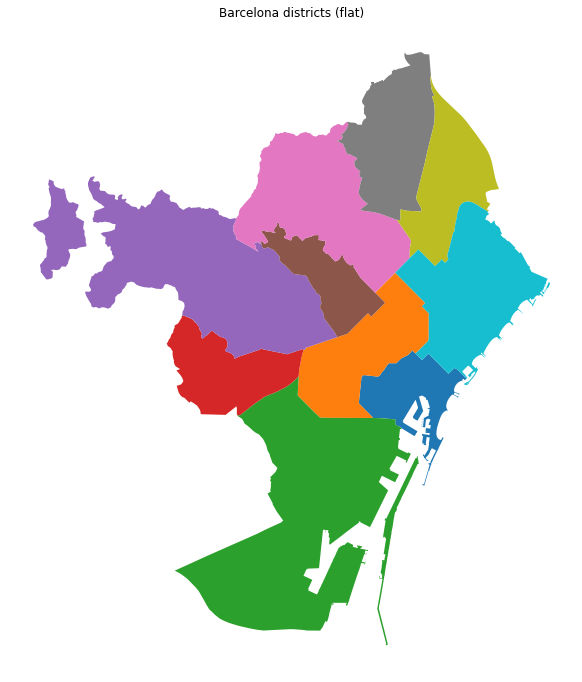

In [14]:
geometry_plot(df_districtes, title='Barcelona districts (flat)', cmap='tab10', figsize=(20, 12))

In [15]:
config = {
  "version": "v1",
  "config": {
    "visState": {
      "filters": [],
      "layers": [
        {
          "id": "3iqxspp",
          "type": "point",
          "config": {
            "dataId": "stations",
            "label": "Point",
            "color": [
              179,
              173,
              158
            ],
            "columns": {
              "lat": "latitude",
              "lng": "longitude",
              "altitude": None
            },
            "isVisible": True,
            "visConfig": {
              "radius": 10,
              "fixedRadius": False,
              "opacity": 0.8,
              "outline": False,
              "thickness": 2,
              "strokeColor": None,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "strokeColorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "radiusRange": [
                0,
                50
              ],
              "filled": True
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "strokeColorField": None,
            "strokeColorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear"
          }
        },
        {
          "id": "4ykp9o2",
          "type": "geojson",
          "config": {
            "dataId": "districtes",
            "label": "districtes",
            "color": [
              18,
              147,
              154
            ],
            "columns": {
              "geojson": "geometry"
            },
            "isVisible": True,
            "visConfig": {
              "opacity": 0.8,
              "strokeOpacity": 0.8,
              "thickness": 0.5,
              "strokeColor": [
                221,
                178,
                124
              ],
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "strokeColorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "radius": 10,
              "sizeRange": [
                0,
                10
              ],
              "radiusRange": [
                0,
                50
              ],
              "heightRange": [
                0,
                500
              ],
              "elevationScale": 5,
              "stroked": True,
              "filled": True,
              "enable3d": False,
              "wireframe": False
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "strokeColorField": None,
            "strokeColorScale": "quantile",
            "heightField": None,
            "heightScale": "linear",
            "radiusField": None,
            "radiusScale": "linear"
          }
        }
      ],
      "interactionConfig": {
        "tooltip": {
          "fieldsToShow": {
            "stations": [
              {
                "name": "name",
                "format": None
              }
            ],
            "districtes": [
              {
                "name": "NOM",
                "format": None
              },
              {
                "name": "PERIMETRE",
                "format": None
              },
              {
                "name": "WEB1",
                "format": None
              }
            ]
          },
          "compareMode": False,
          "compareType": "absolute",
          "enabled": True
        },
        "brush": {
          "size": 0.5,
          "enabled": False
        },
        "geocoder": {
          "enabled": False
        },
        "coordinate": {
          "enabled": False
        }
      },
      "layerBlending": "normal",
      "splitMaps": [],
      "animationConfig": {
        "currentTime": None,
        "speed": 1
      }
    },
    "mapState": {
      "bearing": 0,
      "dragRotate": False,
      "latitude": 41.39266805645755,
      "longitude": 2.140189191771741,
      "pitch": 0,
      "zoom": 11,
      "isSplit": False
    },
    "mapStyle": {
      "styleType": "dark",
      "topLayerGroups": {},
      "visibleLayerGroups": {
        "label": True,
        "road": True,
        "border": False,
        "building": True,
        "water": True,
        "land": True,
        "3d building": False
      },
      "threeDBuildingColor": [
        9.665468314072013,
        17.18305478057247,
        31.1442867897876
      ],
      "mapStyles": {}
    }
  }
}

In [16]:
districts_map = KeplerGl(height=600, data={"stations": df_stations, 
                                           "districtes": df_districtes.copy()}, config=config)
districts_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '3iqxspp', 'type': …

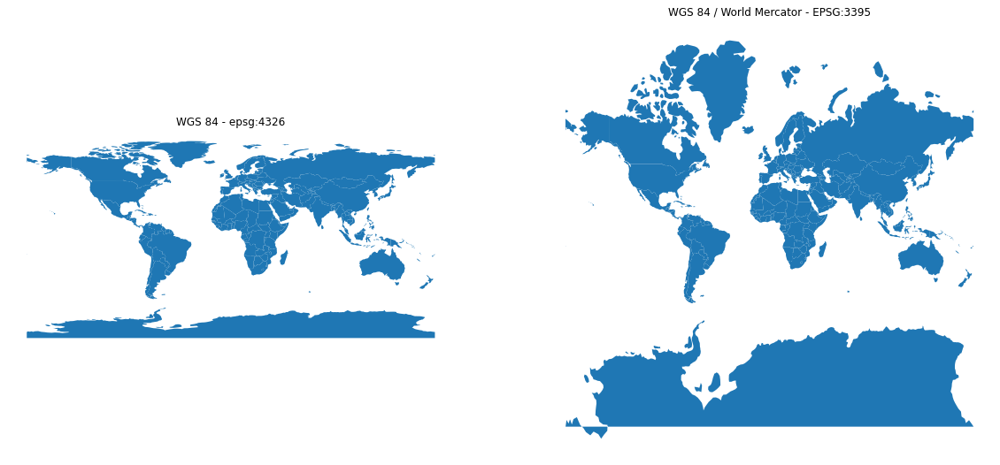

In [17]:
# example from https://geopandas.org/projections.html
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

geometry_plot(world, title=f'{world.crs.name} - {world.crs.srs}', ax=axis[0])

#world = world[(world.name != "Antarctica") & (world.name != "Fr. S. Antarctic Lands")]
world = world.to_crs("EPSG:3395")
geometry_plot(world, title=f'{world.crs.name} - {world.crs.srs}', ax=axis[1])

In [18]:
df_stations = gpd.GeoDataFrame(df_stations.reset_index().name, 
                               geometry=gpd.points_from_xy(df_stations.longitude, df_stations.latitude, crs='epsg:4326'))
df_stations

,name,geometry
0,PG. DE COLOM (LES RAMBLES),POINT (2.17871 41.37643)
1,JARDINS DE CAN FERRERO/PG.DE LA ZONA FRANCA,POINT (2.14156 41.35707)
2,"C/ CIUTAT DE GRANADA, 168 / AV. DIAGONAL",POINT (2.18988 41.40451)
3,PL. POETA BOSCÀ/ATLÀNTIDA,POINT (2.18991 41.37933)
4,"C/ DOCTOR AIGUADER, 2",POINT (2.18709 41.38233)
...,...,...
491,"C/ BOLÍVIA, 76",POINT (2.19135 41.40302)
492,"C/ ROCAFORT, 152",POINT (2.14938 41.38248)
493,PL. ANTONIO LÓPEZ ( VIA LAIETANA),POINT (2.18190 41.38128)
494,PG. DE COLOM (VIA LAIETANA),POINT (2.18219 41.38063)


In [19]:
df_stations_districte = gpd.sjoin(df_stations, df_districtes[["NOM","geometry"]], how="inner", op='intersects').drop(columns=['index_right'])
df_stations_districte.sample(10)

,name,geometry,NOM
157,"C/ WATT, 2",POINT (2.13984 41.37544),Sants-Montjuïc
184,"C/ NÀPOLS, 82",POINT (2.18133 41.39416),Eixample
200,"C/ ENRIC GRANADOS, 35",POINT (2.15991 41.38967),Eixample
173,"C/ MAS CASANOVAS, 137",POINT (2.17456 41.41590),Horta-Guinardó
291,"VIA AUGUSTA, 317",POINT (2.12414 41.39892),Sarrià-Sant Gervasi
387,"C/ VILLAR, 2",POINT (2.18011 41.41648),Horta-Guinardó
388,"C/ PAU ALCOVER, 94",POINT (2.13152 41.40188),Sarrià-Sant Gervasi
414,"C/ JOHN MAYNARD KEYNES, 2 | AV. DIAGONAL",POINT (2.11686 41.38623),Les Corts
235,PL. VICENÇ MARTORELL,POINT (2.16926 41.38426),Ciutat Vella
30,"PL. ANTONIO LÓPEZ (CORREUS, VIA LAIETANA)",POINT (2.18190 41.38128),Ciutat Vella


In [20]:
df_stations_districte_gracia = df_stations_districte[df_stations_districte.NOM=='Gràcia'].copy()
df_stations_districte_gracia

,name,geometry,NOM
35,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",POINT (2.15247 41.40254),Gràcia
161,"PG. VALL D'HEBRÓN, 80",POINT (2.14018 41.41996),Gràcia
232,"PL. DEL NORD, 5",POINT (2.15584 41.40684),Gràcia
233,"C/ DE NIL FABRA, 16-20",POINT (2.15180 41.40594),Gràcia
255,"C/ SARDENYA, 465",POINT (2.16564 41.40909),Gràcia
290,"C/ PI I MARGALL, 38",POINT (2.16353 41.40721),Gràcia
323,"C/ MASSENS, 76",POINT (2.15577 41.40923),Gràcia
345,"C/ GRAN DE GRÀCIA, 37",POINT (2.15643 41.39892),Gràcia
368,"C/ GRAN DE GRÀCIA, 91",POINT (2.15433 41.40069),Gràcia
378,"C/ DEL TORRENT DE LES FLORS, 102",POINT (2.15867 41.40785),Gràcia


## Gracia district - bike stations "area of influence"

In [21]:
def buffer_in_mercator(geometry, distance_x_meters):
    crs = geometry.crs
    return geometry.to_crs(epsg=3395).buffer(distance_x_meters).to_crs(crs)

In [22]:
areas = buffer_in_mercator(df_stations_districte_gracia.set_index("name").geometry, 300)
df_stations_districte_gracia_areas = areas.to_frame().rename(columns={0:'geometry'})
df_stations_districte_gracia.head()

,name,geometry,NOM
35,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",POINT (2.15247 41.40254),Gràcia
161,"PG. VALL D'HEBRÓN, 80",POINT (2.14018 41.41996),Gràcia
232,"PL. DEL NORD, 5",POINT (2.15584 41.40684),Gràcia
233,"C/ DE NIL FABRA, 16-20",POINT (2.15180 41.40594),Gràcia
255,"C/ SARDENYA, 465",POINT (2.16564 41.40909),Gràcia


In [23]:
station_area_map = KeplerGl(height=600, data={"areas": df_stations_districte_gracia_areas.copy(), 
                                              "gracia": df_stations_districte_gracia.copy()})
station_area_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'areas':                                                                                     ge…

## Gracia district - best zone to pick up a bike

In [24]:
df_gracia = pd.merge(df[["free_bikes","name","timestamp"]], 
                     df_stations_districte_gracia, 
                     how="inner")
df_gracia.head()

,free_bikes,name,timestamp,geometry,NOM
0,1,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",2020-10-10 06:40:56.318000+00:00,POINT (2.15247 41.40254),Gràcia
1,1,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",2020-10-10 06:45:58.020000+00:00,POINT (2.15247 41.40254),Gràcia
2,1,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",2020-10-10 06:51:08.310000+00:00,POINT (2.15247 41.40254),Gràcia
3,1,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",2020-10-10 07:00:51.106000+00:00,POINT (2.15247 41.40254),Gràcia
4,1,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",2020-10-10 07:00:51.106000+00:00,POINT (2.15247 41.40254),Gràcia


In [25]:
df_gracia_stats = df_gracia[["name", "free_bikes"]].groupby("name").agg(["median"]).reset_index()
df_gracia_stats.columns = ["name","median"]
df_gracia_stats

,name,median
0,"AV. VALLCARCA, 108",0.0
1,"AV. VALLCARCA, 196",0.0
2,"C / INDÚSTRIA, 10",1.0
3,"C/ CARDENER, 59",3.0
4,"C/ DE BONAVISTA, 14",10.0
5,"C/ DE LA SANTACREU, 2 (PL.DE LA VIRREINA)",1.0
6,"C/ DE NIL FABRA, 16-20",3.0
7,"C/ DEL CANÓ, 1",2.0
8,"C/ DEL TORRENT DE LES FLORS, 102",0.5
9,"C/ ESTEVE TERRADAS, 42",1.0


In [26]:
df_gracia_stats = gpd.GeoDataFrame(df_gracia_stats.set_index('name'), 
                                   geometry=df_stations_districte_gracia_areas.geometry)
df_gracia_stats.head()

,median,geometry
name,,
"AV. VALLCARCA, 108",0.0,"POLYGON ((2.14745 41.41196, 2.14743 41.41176, ..."
"AV. VALLCARCA, 196",0.0,"POLYGON ((2.14485 41.41606, 2.14483 41.41586, ..."
"C / INDÚSTRIA, 10",1.0,"POLYGON ((2.16760 41.40221, 2.16759 41.40201, ..."
"C/ CARDENER, 59",3.0,"POLYGON ((2.16068 41.41060, 2.16067 41.41040, ..."
"C/ DE BONAVISTA, 14",10.0,"POLYGON ((2.16252 41.39834, 2.16251 41.39815, ..."


How to calculate the union overlay of all bicing stations areas https://gis.stackexchange.com/a/246184

In [27]:
shapes = areas.to_list()
areas_overlay = list(polygonize(unary_union(list(x.exterior for x in shapes))))

In [28]:
df_areas_overlay = gpd.GeoDataFrame(data={'geometry':areas_overlay}, crs=areas.crs)
df_areas_overlay.shape

(68, 1)

In [29]:
df_areas_overlay.geometry = buffer_in_mercator(df_areas_overlay.geometry, -0.1)

In [30]:
idx = list(range(20))
random.shuffle(idx)
tab20_shuffle = ListedColormap(list(cm.tab20.colors[i] for i in idx))

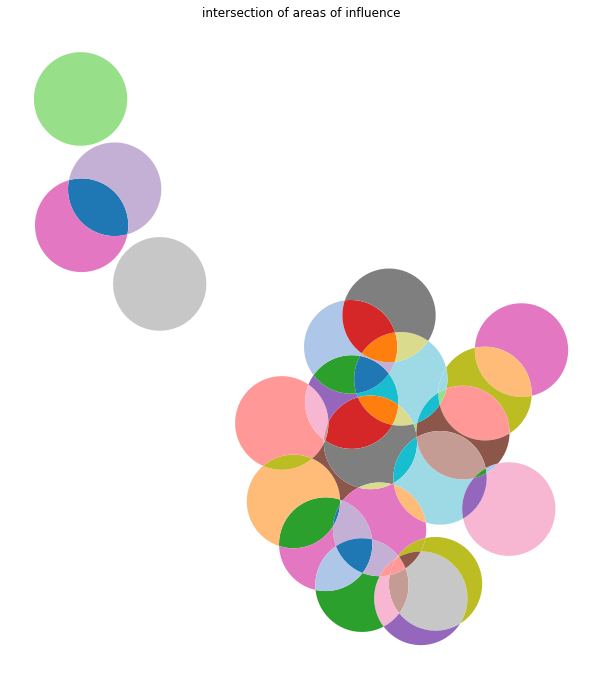

In [31]:
geometry_plot(df_areas_overlay, title="intersection of areas of influence", cmap=tab20_shuffle, figsize=(20, 12))

In [32]:
df_gracia_area_stats = gpd.sjoin(df_areas_overlay, 
                                       df_gracia_stats.reset_index(), 
                                       how="left", op='intersects')\
                                .reset_index()\
                                .rename(columns={'index':'index_left'})
df_gracia_area_stats

,index_left,geometry,index_right,name,median
0,0,"POLYGON ((2.15516 41.40254, 2.15516 41.40240, ...",11.0,"C/ GRAN DE GRÀCIA, 91",1.0
1,0,"POLYGON ((2.15516 41.40254, 2.15516 41.40240, ...",17.0,"GRAN DE GRÀCIA, 155 (METRO FONTANA)",1.0
2,1,"POLYGON ((2.15516 41.40240, 2.15517 41.40254, ...",11.0,"C/ GRAN DE GRÀCIA, 91",1.0
3,2,"POLYGON ((2.15516 41.40240, 2.15515 41.40234, ...",11.0,"C/ GRAN DE GRÀCIA, 91",1.0
4,2,"POLYGON ((2.15516 41.40240, 2.15515 41.40234, ...",7.0,"C/ DEL CANÓ, 1",2.0
...,...,...,...,...,...
121,65,"POLYGON ((2.16010 41.40163, 2.15990 41.40169, ...",13.0,"C/ MONTMANY, 1",5.0
122,66,"POLYGON ((2.16209 41.39725, 2.16220 41.39739, ...",16.0,"C/ TORRENT DE L'OLLA, 11",1.0
123,67,"POLYGON ((2.15745 41.39930, 2.15758 41.39947, ...",4.0,"C/ DE BONAVISTA, 14",10.0
124,67,"POLYGON ((2.15745 41.39930, 2.15758 41.39947, ...",10.0,"C/ GRAN DE GRÀCIA, 37",0.0


In [33]:
assert df_gracia_area_stats["index_left"].nunique() == df_areas_overlay.shape[0]

In [34]:
df_gracia_area_stats[df_gracia_area_stats.name.isna()]

,index_left,geometry,index_right,name,median
13,8,"POLYGON ((2.15516 41.40262, 2.15515 41.40274, ...",NaN,NaN,NaN
93,49,"POLYGON ((2.15939 41.40589, 2.15945 41.40590, ...",NaN,NaN,NaN
97,52,"POLYGON ((2.15814 41.40329, 2.15819 41.40331, ...",NaN,NaN,NaN


In [35]:
df_gracia_area_stats.dropna(inplace=True)

In [36]:
df_gracia_area_stats['free_bikes_median'] = df_gracia_area_stats.groupby("index_left")['median'].transform(sum)

In [37]:
df_gracia_free_bikes = df_gracia_area_stats.drop_duplicates(['index_left'])

In [38]:
config = {
  "version": "v1",
  "config": {
    "visState": {
      "filters": [],
      "layers": [
        {
          "id": "3cwe2",
          "type": "geojson",
          "config": {
            "dataId": "areas",
            "label": "areas",
            "color": [
              18,
              147,
              154
            ],
            "columns": {
              "geojson": "geometry"
            },
            "isVisible": True,
            "visConfig": {
              "opacity": 0.53,
              "strokeOpacity": 0.8,
              "thickness": 0.5,
              "strokeColor": [
                82,
                163,
                83
              ],
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "strokeColorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "radius": 10,
              "sizeRange": [
                0,
                10
              ],
              "radiusRange": [
                0,
                50
              ],
              "heightRange": [
                0,
                500
              ],
              "elevationScale": 5,
              "stroked": True,
              "filled": True,
              "enable3d": False,
              "wireframe": False
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": {
              "name": "free_bikes_median",
              "type": "real"
            },
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "strokeColorField": None,
            "strokeColorScale": "quantile",
            "heightField": None,
            "heightScale": "linear",
            "radiusField": None,
            "radiusScale": "linear"
          }
        }
      ],
      "interactionConfig": {
        "tooltip": {
          "fieldsToShow": {
            "areas": [
              {
                "name": "index_left",
                "format": None
              },
              {
                "name": "name",
                "format": None
              },
              {
                "name": "free_bikes_median",
                "format": None
              }
            ]
          },
          "compareMode": False,
          "compareType": "absolute",
          "enabled": True
        },
        "brush": {
          "size": 0.5,
          "enabled": False
        },
        "geocoder": {
          "enabled": False
        },
        "coordinate": {
          "enabled": False
        }
      },
      "layerBlending": "normal",
      "splitMaps": [],
      "animationConfig": {
        "currentTime": None,
        "speed": 1
      }
    },
    "mapState": {
      "bearing": 0,
      "dragRotate": False,
      "latitude": 41.40862083087605,
      "longitude": 2.1449867211226996,
      "pitch": 0,
      "zoom": 13.451941083083048,
      "isSplit": False
    },
    "mapStyle": {
      "styleType": "dark",
      "topLayerGroups": {},
      "visibleLayerGroups": {
        "label": True,
        "road": True,
        "border": False,
        "building": True,
        "water": True,
        "land": True,
        "3d building": False
      },
      "threeDBuildingColor": [
        9.665468314072013,
        17.18305478057247,
        31.1442867897876
      ],
      "mapStyles": {}
    }
  }
}

In [39]:
gracia_free_bikes_map = KeplerGl(height=600, data={"areas": df_gracia_free_bikes.copy()}, config=config)
gracia_free_bikes_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '3cwe2', 'type': 'g…

In [40]:
df_gracia_free_bikes.loc[df_gracia_free_bikes.free_bikes_median.idxmax()]

index_left                                                          47
geometry             POLYGON ((2.158569910904795 41.40013894276378,...
index_right                                                          4
name                                               C/ DE BONAVISTA, 14
median                                                              10
free_bikes_median                                                   13
Name: 86, dtype: object